In [1]:
import numpy as np
import pandas as pd
import pyarrow as pa

# **Foundational libraries**

## **NumPy**

In [2]:
arr = np.arange(1, 10).reshape(3, -1)
df = pd.DataFrame(arr)

df

,0,1,2
0,1,2,3
1,4,5,6
2,7,8,9


In [4]:
df.to_numpy()

array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])

In [5]:
np.log(df) # Manu Numpy Functionality accept a DataDrame as an Argument

,0,1,2
0,0.000000,0.693147,1.098612
1,1.386294,1.609438,1.791759
2,1.945910,2.079442,2.197225


## **PyArrow**

In [7]:
tb1 = pa.Table.from_pandas(df)

tb1

pyarrow.Table
0: int64
1: int64
2: int64
----
0: [[1,4,7]]
1: [[2,5,8]]
2: [[3,6,9]]

In [8]:
tb1.to_pandas()

,0,1,2
0,1,2,3
1,4,5,6
2,7,8,9


# **Exploratory data analysis**

## **YData Profiling**

In [9]:
df = pd.read_csv(
    "../Datasets/vehicles.csv.zip",
    dtype_backend="numpy_nullable",
    usecols=[
        "id",
        "engId",
        "make",
        "model","cylinders",
        "city08",
        "highway08",
        "year",
        "trany",
    ]
)

df.head()

,city08,cylinders,engId,highway08,id,make,model,trany,year
0,19,4,9011,25,1,Alfa Romeo,Spider Veloce 2000,Manual 5-spd,1985
1,9,12,22020,14,10,Ferrari,Testarossa,Manual 5-spd,1985
2,23,4,2100,33,100,Dodge,Charger,Manual 5-spd,1985
3,10,8,2850,12,1000,Dodge,B150/B250 Wagon 2WD,Automatic 3-spd,1985
4,17,4,66031,23,10000,Subaru,Legacy AWD Turbo,Manual 5-spd,1993


In [15]:
from ydata_profiling import ProfileReport

In [16]:
profile = ProfileReport(df, title="Vehicles Profile Report")

In [18]:
# profile.to_widgets()

In [19]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
profile

In [21]:
profile.to_file("vehicles_profile.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# **Data validation**

## **Great Expectations**

In [23]:
df = pd.read_csv(
    "../Datasets/vehicles.csv.zip",
    dtype_backend="numpy_nullable",
    dtype={
        "rangeA": pd.StringDtype(),
        "mfrCode": pd.StringDtype(),
        "c240Dscr": pd.StringDtype(),
        "c240bDscr": pd.StringDtype()
    }
)

df.head()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,...,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb
0,14.167143,0.0,0.0,0.0,19,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
1,27.046364,0.0,0.0,0.0,9,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
2,11.018889,0.0,0.0,0.0,23,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
3,27.046364,0.0,0.0,0.0,10,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
4,15.658421,0.0,0.0,0.0,17,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0


In [25]:
import great_expectations as gx

In [26]:
context = gx.get_context()

In [27]:
datasource = context.data_sources.add_pandas(name="pandas_datasource")
data_asset = datasource.add_dataframe_asset(name="vehicles")

In [28]:
batch_definition_name = "dataframe_definition"
batch_definition = data_asset.add_batch_definition_whole_dataframe(
    batch_definition_name
)
batch = batch_definition.get_batch(batch_parameters={
    "dataframe": df
})

In [29]:
city_exp = gx.expectations.ExpectColumnValuesToNotBeNull(
    column="city08"
)
result = batch.validate(city_exp)

result

Calculating Metrics:   0%|          | 0/8 [00:00<?, ?it/s]

{
  "success": true,
  "expectation_config": {
    "type": "expect_column_values_to_not_be_null",
    "kwargs": {
      "batch_id": "pandas_datasource-vehicles",
      "column": "city08"
    },
    "meta": {},
    "severity": "critical"
  },
  "result": {
    "element_count": 47523,
    "unexpected_count": 0,
    "unexpected_percent": 0.0,
    "partial_unexpected_list": [],
    "partial_unexpected_counts": [],
    "partial_unexpected_index_list": []
  },
  "meta": {},
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  }
}

In [30]:
cylinders_exp = gx.expectations.ExpectColumnValuesToNotBeNull(
column="cylinders"
)
result = batch.validate(cylinders_exp)

result

Calculating Metrics:   0%|          | 0/8 [00:00<?, ?it/s]

{
  "success": false,
  "expectation_config": {
    "type": "expect_column_values_to_not_be_null",
    "kwargs": {
      "batch_id": "pandas_datasource-vehicles",
      "column": "cylinders"
    },
    "meta": {},
    "severity": "critical"
  },
  "result": {
    "element_count": 47523,
    "unexpected_count": 801,
    "unexpected_percent": 1.685499652799697,
    "partial_unexpected_list": [
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null,
      null
    ],
    "partial_unexpected_counts": [
      {
        "value": null,
        "count": 20
      }
    ],
    "partial_unexpected_index_list": [
      7138,
      7139,
      8143,
      8144,
      8146,
      8147,
      9212,
      9213,
      10329,
      21410,
      21411,
      21500,
      23016,
      23017,
      23018,
      23019,
      23020,
      

# **Visualization**

In [31]:
df = pd.read_csv(
    "../Datasets/vehicles.csv.zip",
    dtype_backend="numpy_nullable",
    dtype={
        "rangeA": pd.StringDtype(),
        "mfrCode": pd.StringDtype(),
        "c240Dscr": pd.StringDtype(),
        "c240bDscr": pd.StringDtype()
    }
)

df.head()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,...,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb
0,14.167143,0.0,0.0,0.0,19,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
1,27.046364,0.0,0.0,0.0,9,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
2,11.018889,0.0,0.0,0.0,23,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
3,27.046364,0.0,0.0,0.0,10,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
4,15.658421,0.0,0.0,0.0,17,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0


## **Plotly**

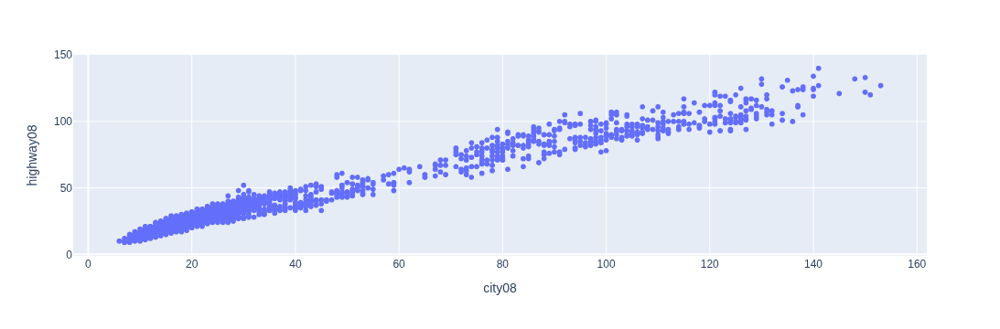

In [32]:
df.plot(
    kind="scatter",
    x="city08",
    y="highway08",
    backend="plotly",
    hover_data={"make": True, "model": True, "year": True},
)

## **PyGWalker**

In [53]:
import pygwalker as pyg

In [61]:
walker = pyg.walk(df, env="Jupyter", use_kernel_calc=True)

# **Data science**

## **scikit-learn**

In [63]:
df = pd.read_csv(
    "../Datasets/vehicles.csv.zip",
    dtype_backend="numpy_nullable",
    dtype={
        "rangeA": pd.StringDtype(),
        "mfrCode": pd.StringDtype(),
        "c240Dscr": pd.StringDtype(),
        "c240bDscr": pd.StringDtype()
    }
)

df.head()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,...,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb
0,14.167143,0.0,0.0,0.0,19,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
1,27.046364,0.0,0.0,0.0,9,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
2,11.018889,0.0,0.0,0.0,23,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
3,27.046364,0.0,0.0,0.0,10,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
4,15.658421,0.0,0.0,0.0,17,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0


In [64]:
num_df = df.select_dtypes(include=["number"])
num_df = num_df.drop(columns=["cylinders", "displ"])

In [65]:
from sklearn.model_selection import train_test_split

In [66]:
target_col = "comb08"
X = num_df.drop(columns=[target_col])
y = num_df[target_col]

X_train, X_test, y_train, y_test = train_test_split(X, y)

In [67]:
from sklearn import linear_model

In [68]:
regr = linear_model.LinearRegression()

regr.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [69]:
y_pred = regr.predict(X_test)

In [70]:
from sklearn.metrics import mean_squared_error

In [71]:
mean_squared_error(y_test, y_pred)

0.11526983189354578

## **XGBoost**

In [72]:
brands = {"Dodge", "Toyota", "Volvo", "BMW", "Buick", "Audi", "Volkswagen", "Subaru"}

df2 = df[df["make"].isin(brands)]
df2 = df2.drop(columns=["cylinders", "displ"])

In [73]:
X = df2.select_dtypes(include=["number"])
y = df2["make"].astype(pd.CategoricalDtype())

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y.cat.codes)

In [77]:
from xgboost import XGBClassifier

In [78]:
bst = XGBClassifier()

bst.fit(X_train, y_train)

,objective,'multi:softprob'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,True
,eval_metric,None


In [79]:
preds = bst.predict(X_test)

In [80]:
accuracy = (preds == y_test).sum() / len(y_test)
print(f"Model prediction accuracy is: {accuracy:.2%}")

Model prediction accuracy is: 95.85%


# **Databases**

## **DuckDB**

In [81]:
df = pd.read_csv(
    "../Datasets/vehicles.csv.zip",
    dtype_backend="numpy_nullable",
    dtype={
        "rangeA": pd.StringDtype(),
        "mfrCode": pd.StringDtype(),
        "c240Dscr": pd.StringDtype(),
        "c240bDscr": pd.StringDtype()
    }
)

df.head()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,...,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb
0,14.167143,0.0,0.0,0.0,19,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
1,27.046364,0.0,0.0,0.0,9,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
2,11.018889,0.0,0.0,0.0,23,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
3,27.046364,0.0,0.0,0.0,10,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0
4,15.658421,0.0,0.0,0.0,17,0.0,0,0.0,0.0,0.0,...,<NA>,<NA>,0.0,<NA>,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,<NA>,0,0,0


In [83]:
import duckdb

In [84]:
duckdb.sql("CREATE TABLE vehicles AS SELECT * FROM df")

In [85]:
duckdb.sql("SELECT COUNT(*) FROM vehicles WHERE make = 'Honda'")

┌──────────────┐
│ count_star() │
│    int64     │
├──────────────┤
│         1183 │
└──────────────┘

In [86]:
duckdb.sql(
    "SELECT make, model, year, id, city08 FROM vehicles where make = 'Honda' LIMIT 5"
).df()

,make,model,year,id,city08
0,Honda,Accord Wagon,1993,10145,18
1,Honda,Accord Wagon,1993,10146,20
2,Honda,Civic Del Sol,1994,10631,25
3,Honda,Civic Del Sol,1994,10632,30
4,Honda,Civic Del Sol,1994,10633,23


# **Other DataFrame libraries**

## **Ibis**

In [2]:
import ibis

In [3]:
df = pd.read_csv(
    "../Datasets/vehicles.csv.zip",
    dtype_backend="numpy_nullable",
    usecols=["id", "year", "make", "model", "city08"],
)

t = ibis.memtable(df)

In [4]:
t.filter(t.make == "Honda").select("make", "model", "year", "city08")

r0 := InMemoryTable
  data:
    PandasDataFrameProxy:
             city08     id        make                model  year
      0          19      1  Alfa Romeo   Spider Veloce 2000  1985
      1           9     10     Ferrari           Testarossa  1985
      2          23    100       Dodge              Charger  1985
      3          10   1000       Dodge  B150/B250 Wagon 2WD  1985
      4          17  10000      Subaru     Legacy AWD Turbo  1993
      ...       ...    ...         ...                  ...   ...
      47518      19   9995      Subaru               Legacy  1993
      47519      20   9996      Subaru               Legacy  1993
      47520      18   9997      Subaru           Legacy AWD  1993
      47521      18   9998      Subaru           Legacy AWD  1993
      47522      16   9999      Subaru     Legacy AWD Turbo  1993

      [47523 rows x 5 columns]

r1 := Filter[r0]
  r0.make == 'Honda'

Project[r1]
  make:   r1.make
  model:  r1.model
  year:   r1.year
  city08: r1.city08

In [5]:
t.filter(t.make == "Honda").select(
    "make", "model", "year", "city08"
).to_pandas().head()

,make,model,year,city08
0,Honda,Accord Wagon,1993,18
1,Honda,Accord Wagon,1993,20
2,Honda,Civic Del Sol,1994,25
3,Honda,Civic Del Sol,1994,30
4,Honda,Civic Del Sol,1994,23


In [6]:
t.filter(t.make == "Honda").select(
    "make", "model", "year", "city08"
).to_pyarrow()

pyarrow.Table
make: string
model: string
year: int64
city08: int64
----
make: [["Honda","Honda","Honda","Honda","Honda",...,"Honda","Honda","Honda","Honda","Honda"]]
model: [["Accord Wagon","Accord Wagon","Civic Del Sol","Civic Del Sol","Civic Del Sol",...,"Prelude","Prelude","Prelude","Accord","Accord"]]
year: [[1993,1993,1994,1994,1994,...,1993,1993,1993,1993,1993]]
city08: [[18,20,25,30,23,...,21,19,19,19,21]]

## **Dask**

In [8]:
import dask.dataframe as dd

In [9]:
ddf = dd.from_pandas(df, npartitions=10)

In [10]:
ddf.size.compute()

237615

In [11]:
ddf.compute().head()

,city08,id,make,model,year
0,19,1,Alfa Romeo,Spider Veloce 2000,1985
1,9,10,Ferrari,Testarossa,1985
2,23,100,Dodge,Charger,1985
3,10,1000,Dodge,B150/B250 Wagon 2WD,1985
4,17,10000,Subaru,Legacy AWD Turbo,1993


## **Polars**

In [13]:
import polars as pl

In [14]:
pl_df = pl.from_pandas(df)

pl_df.head()

city08,id,make,model,year
i64,i64,str,str,i64
19,1,"""Alfa Romeo""","""Spider Veloce 2000""",1985
9,10,"""Ferrari""","""Testarossa""",1985
23,100,"""Dodge""","""Charger""",1985
10,1000,"""Dodge""","""B150/B250 Wagon 2WD""",1985
17,10000,"""Subaru""","""Legacy AWD Turbo""",1993


In [15]:
lz_df = pl.LazyFrame(df)

In [16]:
lz_df.filter(
    pl.col("make") == "Honda"
).select(["make", "model", "year", "city08"]).collect().head()

make,model,year,city08
str,str,i64,i64
"""Honda""","""Accord Wagon""",1993,18
"""Honda""","""Accord Wagon""",1993,20
"""Honda""","""Civic Del Sol""",1994,25
"""Honda""","""Civic Del Sol""",1994,30
"""Honda""","""Civic Del Sol""",1994,23


In [17]:
lz_df.filter(
    pl.col("make") == "Honda"
).select(["make", "model", "year", "city08"]).collect().to_pandas().head()

,make,model,year,city08
0,Honda,Accord Wagon,1993,18
1,Honda,Accord Wagon,1993,20
2,Honda,Civic Del Sol,1994,25
3,Honda,Civic Del Sol,1994,30
4,Honda,Civic Del Sol,1994,23


## **cuDF**

In [18]:
# import cudf.pandas
# cudf.pandas.install()
# import pandas as pd